**Методы снижения размерности на примере корпуса русских стихотворений**

Источник датасета: https://www.kaggle.com/datasets/greencools/russianpoetry

In [1]:
import umap # Импортирую umap в начале т.к. в некоторых случаях приводит к бесконечной загрузке :(

In [2]:
import pandas as pd
df = pd.read_csv("data\\russianPoetryWithTheme.csv")
df.head()

,author,date_from,text,name,date_to,themes/item/0,themes/item/1,themes/item/2,themes/item/3
0,Михаил Лермонтов,1829.0,"Забывши волнения жизни мятежной,\r\nОдин жил в...",Забывши волнения жизни мятежной...,1829.0,NaN,NaN,NaN,NaN
1,Сергей Есенин,1917.0,"Нивы сжаты, рощи голы,\r\nОт воды туман и сыро...","Нивы сжаты, рощи голы...",1918.0,NaN,NaN,NaN,NaN
2,Игорь Северянин,1919.0,Лючинь печальная читала вечером ручьисто-вкрад...,ЧАРЫ ЛЮЧИНЬ,1919.0,NaN,NaN,NaN,NaN
3,Анатолий Жигулин,1963.0,"Глыбу кварца разбили молотом,\r\nИ, веселым ог...",Золото,1963.0,NaN,NaN,NaN,NaN
4,Николай Тихонов,1937.0,"Хлынул дождь, когда девушки, встав в хоровод,\...",Хоровод в Сульдуси,1940.0,NaN,NaN,NaN,NaN


Предобработка и лемматизация корпуса

In [3]:
# !pip install pymorphy2

import pymorphy2
import re
import nltk
nltk.download('stopwords')

def pre_process(str, morph):
    str = str.lower()
    str = re.sub(r'[^\w\s]','',str) # Удаление знаков препинания

    tokens = nltk.word_tokenize(str)
    stop_words = nltk.corpus.stopwords.words('russian')
    filtered_tokens = [w for w in tokens if not w in stop_words and len(w) > 2]

    lemmatized_tokens = [morph.parse(word)[0].normal_form for word in filtered_tokens] # Лемматизация (slow af)

    return ' '.join(lemmatized_tokens)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\St0negor\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
morph = pymorphy2.MorphAnalyzer()
print(pre_process('Пример выполнения функции предобработки к тексту, написанному с использованием знаков препинания, стоп слов и ПРОПИСНЫХ БУКВ\r\n',morph))

пример выполнение функция предобработка текст написать использование знак препинание стоп слово прописной буква


In [5]:
%%time
import swifter

morph = pymorphy2.MorphAnalyzer()
text = df['text']
text = text.swifter.apply(lambda x: pre_process(x,morph))

Pandas Apply:   0%|          | 0/16694 [00:00<?, ?it/s]

Wall time: 2min 51s


In [6]:
print(text[1337])

хоровод рифма сладко дышаться вечерний воздух колыхаться немой нежный роза дух высь оранжевый даль лазоревый забыть гора прийти ранний чистый озеро куст акация стать грёза перо писать варьяции петь элегия романс пылкий ссылка нега медлить румянец золото иль страсть исполоть слово бред луна луч палевый пробраться перепел листва эмалевый роса перепить тоска сердечный отдаться муза я иллюзия миф вечный нервно молния сверкать змея пойти аллея поехать чёлн волна озеро топить бессилие жизнь роза сера крылия орёл синь поплыть чудесный мечта уныние проклясть тесный лживый роза дух мой иллюзия душа контузия больной воздух высь стать сумрачный даль фиолетовый душа дума мрачный тихий пульс считать маятник грудь конвульсия счастие памятник


Векторизация текста

In [7]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=0.01, lowercase=False) # min_df = 0.01 уберет слова, встречающиеся реже 1 процента во всех стихотворениях, что уменьшит размерность вектора,
# а это значит меньше вычислений для моего слабого компуктера
vectors = vectorizer.fit_transform(text)

print(vectors.shape)

(16694, 1238)


Визуализация при помощи методов снижения размерности

1) Линейные методы: TruncatedSVD и PCA

In [8]:
random_state = 1337

In [9]:
import matplotlib.pyplot as plt
import numpy as np

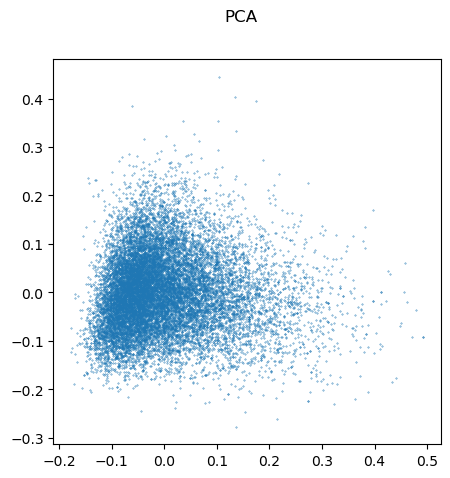

In [10]:
from sklearn.decomposition import PCA
vectors_embedded = PCA(n_components=2, random_state=random_state).fit_transform(vectors.todense())
vectors_embedded  = np.swapaxes(vectors_embedded,0,1)
plt.figure(figsize=(5,5))
plt.scatter(vectors_embedded[0],vectors_embedded[1],s=0.1)
plt.suptitle("PCA")
plt.show()

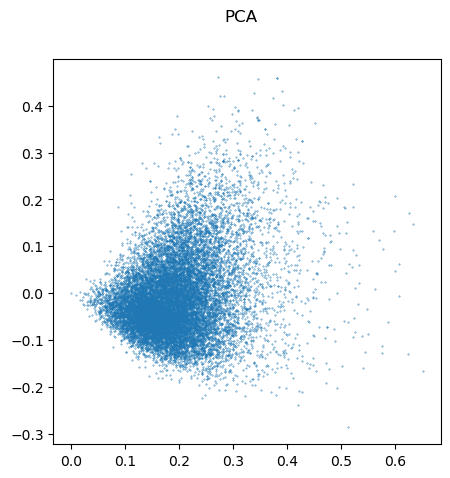

In [11]:
from sklearn.decomposition import TruncatedSVD
vectors_embedded = TruncatedSVD(n_components=2, random_state=random_state).fit_transform(vectors)
vectors_embedded  = np.swapaxes(vectors_embedded,0,1)
plt.figure(figsize=(5,5))
plt.scatter(vectors_embedded[0],vectors_embedded[1],s=0.1)
plt.suptitle("PCA")
plt.show()

Линейные методы снижения размерности не смогли отобразить явной структуры в данных :(

2) Нелинейные методы: t-SNE и UMAP

t-SNE

In [12]:
%%time
from sklearn.manifold import TSNE
perplexities = [5,10,25,50]
TSNE_embeddings = []

for perplexity in perplexities:
    print('perplexity =', perplexity)
    vectors_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=perplexity, random_state=random_state).fit_transform(vectors)
    vectors_embedded  = np.swapaxes(vectors_embedded,0,1)
    TSNE_embeddings.append(vectors_embedded)

perplexity = 5
perplexity = 10
perplexity = 25
perplexity = 50
Wall time: 3min 46s


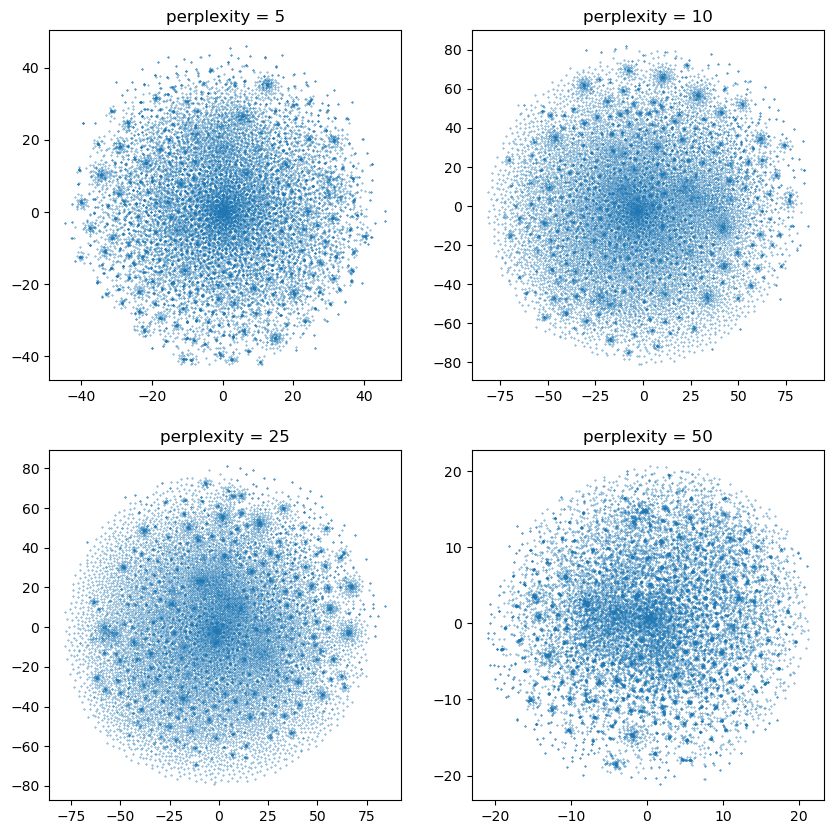

In [13]:
fig, axs = plt.subplots(2,2, figsize=(10,10))
axs = axs.ravel()
for i, vectors_embedded in enumerate(TSNE_embeddings):
    axs[i].scatter(vectors_embedded[0],vectors_embedded[1],s=0.1)
    axs[i].title.set_text(f"perplexity = {perplexities[i]}")
plt.show()

Низкие значения perplexity привели к более наглядному отображению данных.

UMAP

In [14]:
%%time

min_dist_values = [0.01, 0.1, 0.5]
n_neighbors_values = [5, 10, 20, 50]

UMAP_embedding = []


for min_dist in min_dist_values:
    for n_neighbors in n_neighbors_values:
        print(f"n_neighbors = {n_neighbors}, min_dist = {min_dist}")
        reducer = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist, random_state=random_state)
        vectors_embedded = reducer.fit_transform(vectors)
        vectors_embedded  = np.swapaxes(vectors_embedded,0,1)
        UMAP_embedding.append(vectors_embedded)

n_neighbors = 5, min_dist = 0.01
n_neighbors = 10, min_dist = 0.01
n_neighbors = 20, min_dist = 0.01
n_neighbors = 50, min_dist = 0.01
n_neighbors = 5, min_dist = 0.1
n_neighbors = 10, min_dist = 0.1
n_neighbors = 20, min_dist = 0.1
n_neighbors = 50, min_dist = 0.1
n_neighbors = 5, min_dist = 0.5
n_neighbors = 10, min_dist = 0.5
n_neighbors = 20, min_dist = 0.5
n_neighbors = 50, min_dist = 0.5
Wall time: 4min 48s


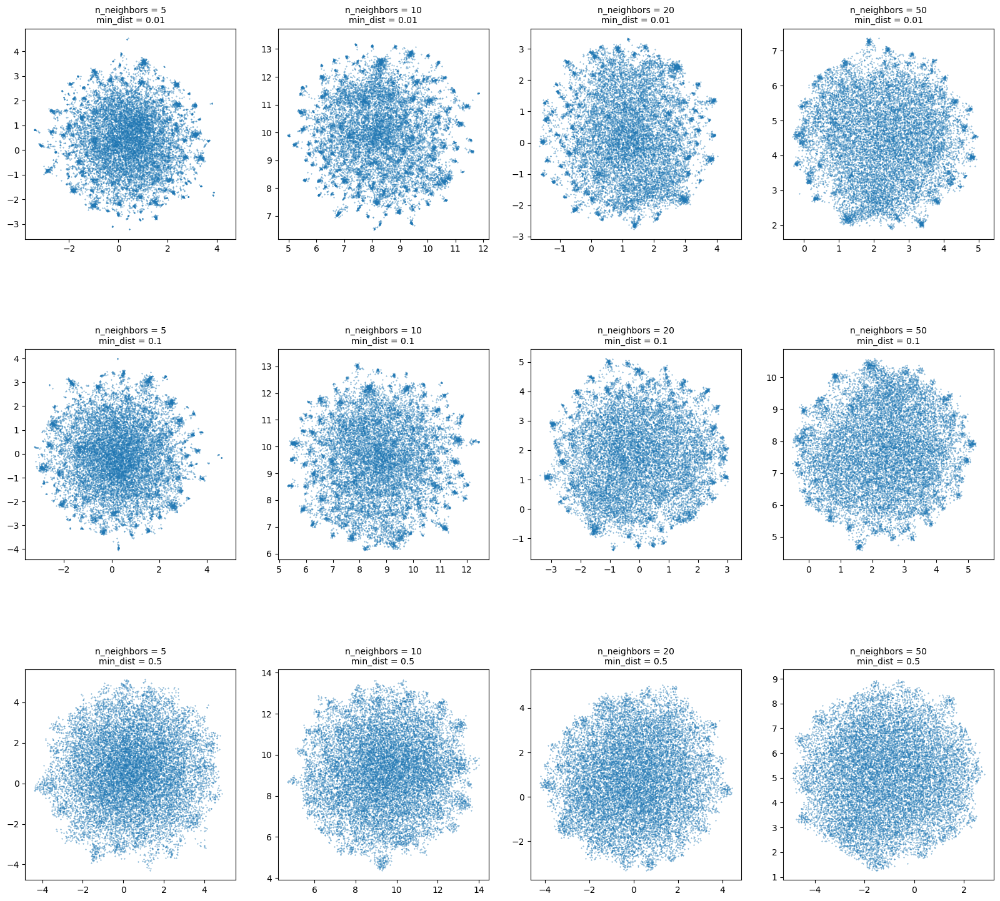

In [15]:
fig, axs = plt.subplots(3,4, figsize=(20,20))
fig.subplots_adjust(hspace=0.0, wspace=0.2)
axs = axs.ravel()
for i, vectors_embedded in enumerate(UMAP_embedding):

    n_neighbors = n_neighbors_values[i%4]
    min_dist = min_dist_values[i//4]

    axs[i].scatter(vectors_embedded[0],vectors_embedded[1],s=0.1)
    axs[i].set_title(f"n_neighbors = {n_neighbors}\nmin_dist = {min_dist}", fontdict={'fontsize': 10})

    axs[i].axis('square')
plt.show()

Высокие значения n_neighbors и min_dist приводит к появлению большого количества шума в двухмерном изображении.
Значения n_neighbors 5-10 и min_dist 0.01 - 0.1 дают более четкое визуальное представление данных.

Можно сделать вывод, что нелинейные методы снижения размерности способны запечатлеть структуру данных более явно.

UMAP дает более наглядное представление данных, чем t-SNE (зато изображение, полученное t-SNE, выглядит красиво ✨)

Сравним нелинейные методы в 3d представлении.

In [16]:
%%time

reducer = umap.UMAP(n_components=3, n_neighbors=10, min_dist=0.01, random_state=random_state)
UMAP_3D_embedding = reducer.fit_transform(vectors)
UMAP_3D_embedding  = np.swapaxes(UMAP_3D_embedding,0,1)

UMAP_3D_embedding.shape

Wall time: 13.3 s


(3, 16694)

In [17]:
%%time

TSNE_3D_embedding = TSNE(n_components=3, learning_rate='auto', init='random', perplexity=5, random_state=random_state).fit_transform(vectors)
TSNE_3D_embedding  = np.swapaxes(TSNE_3D_embedding,0,1)

Wall time: 3min 30s


In [18]:
import plotly
import plotly.graph_objs as go

plotly.offline.init_notebook_mode()
trace = go.Scatter3d(
    x=TSNE_3D_embedding[0],
    y=TSNE_3D_embedding[1],
    z=TSNE_3D_embedding[2],
    mode='markers',
    marker={
        'size': 1.2,
        'opacity': 0.4,
    }
)
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)
data = [trace]
plot_figure = go.Figure(data=data, layout=layout)
plot_figure.write_html("data/TSNE3D.html")
plotly.offline.iplot(plot_figure)

In [19]:
import plotly
import plotly.graph_objs as go

plotly.offline.init_notebook_mode()
trace = go.Scatter3d(
    x=UMAP_3D_embedding[0],
    y=UMAP_3D_embedding[1],
    z=UMAP_3D_embedding[2],
    mode='markers',
    marker={
        'size': 1.2,
        'opacity': 0.4,
    }
)
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)
data = [trace]
plot_figure = go.Figure(data=data, layout=layout)
plot_figure.write_html("data/UMAP3D.html")
plotly.offline.iplot(plot_figure)

🌌

!!! Файлы с графиками прикрепил к домашнему заданию, т.к. colab не поддерживает plotly виджеты.

Из двух графиков очевидно, что UMAP справился с задачей представления наших данных лучше и в трехмерном пространстве тоже.